In [ ]:
#load all the import tensorflow as tf
import os
from tensorflow import keras
from IPython.display import Image, display
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import vgg19

In [ ]:
#setting the height and width of the images
height =600
width = 400

In [ ]:
# loading the image paths 
# base path is the path to the main image and stylepath is tha path the the image with the style we want to mimic.
basepath = '/content/PXL_20221023_205738097.MP.jpg'
#basepath = tf.keras.utils.get_file('katie','/content/PXL_20221023_205738097.MP.jpg')
stylepath = tf.keras.utils.get_file(
    "starry_night.jpg", "https://i.imgur.com/9ooB60I.jpg"
)

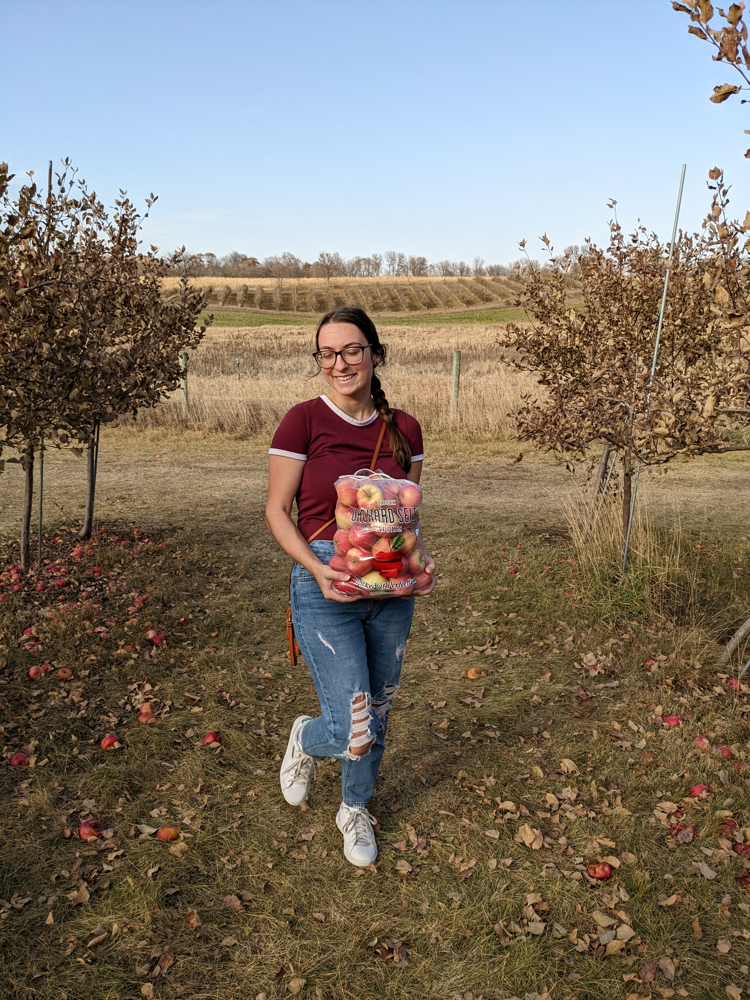

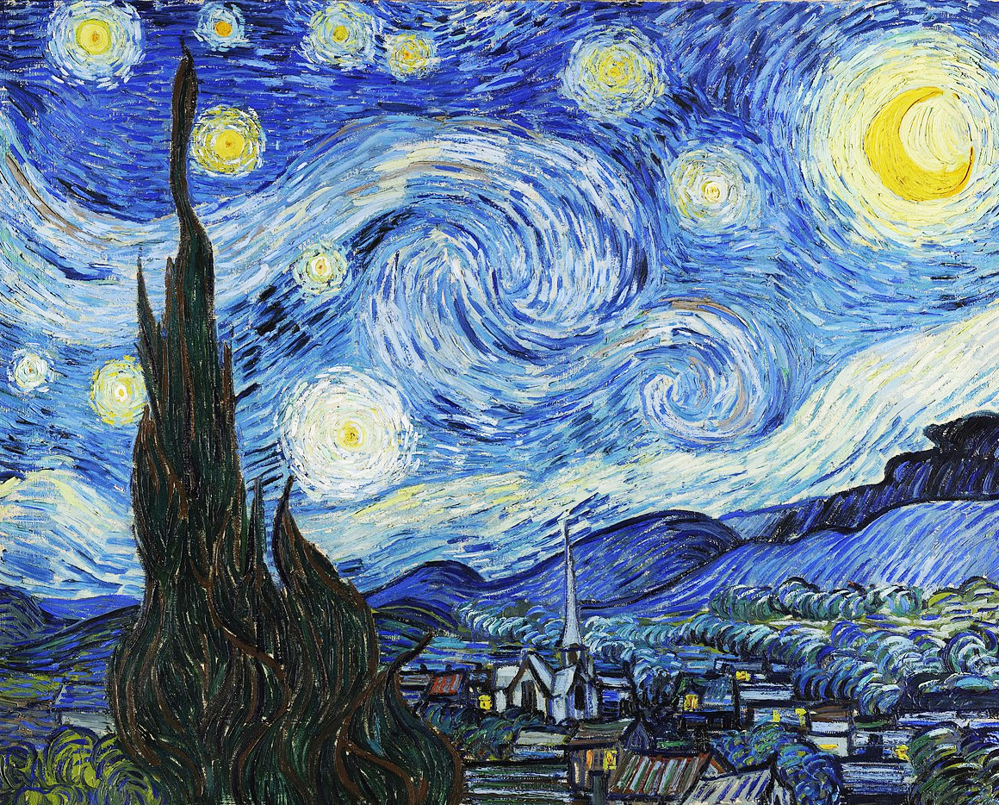

In [ ]:
# displaying the orignal image and then the style image
# the the goal of this project is to have the orignal image with the same style as the style image
display(Image(basepath))
display(Image(stylepath))

In [ ]:
# a preprocessing function that loads the image from path and converts it to the right size. 
# then makes it a 4d tensor of shape(1,?,?,3)
#then runs it through the vgg19 preprocessing which does 'images are converted from RGB to BGR, 
#    then each color channel is zero-centered with respect to the ImageNet dataset,')
def prepro(path,size):
  img = keras.preprocessing.image.load_img(path,target_size=size)
  img = keras.preprocessing.image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = vgg19.preprocess_input(img)
  img = tf. convert_to_tensor(img)
  return img

In [ ]:
# getting content loss which takes the new combined image and sees how close it 
# matches the orginal image
def content_loss(created, base):
  return tf.math.reduce_sum(tf.math.square(created-base))

# takes the imput matrix and converts it to (#filters,size,size)
# then takes the new matrix and makes it of shape (#filters,size^2)
# reutns the matrix multiplication of that new matix * its transpose
def gram(y):
  transpose = tf.transpose(y,perm=(2,1, 0))
  
  y = tf.reshape(transpose,(transpose.shape[0],(transpose.shape[1]*transpose.shape[2])))
  
  return tf.matmul(y,tf.transpose(y))

# this is where we get the loss with respect to the style of the combined image
# and the style reference. it computes the gram matrix for both then does 
# sum of sqared errors and returns the loss
def style_loss(created, style):
  C = gram(created)
  S = gram(style)
  loss = tf.math.reduce_sum(tf.math.square(S-C))
  loss = loss/(4*9*(height*width)**2)
  return loss

  
def total_variation_loss(x):
    a = tf.square(
        x[:, : height - 1, : width - 1, :] - x[:, 1:, : width - 1, :]
    )
   
    
    b = tf.square(
        x[:, : height - 1, : width - 1, :] - x[:, : height - 1, 1:, :]
    )
   
   
    #print('starting power')
    tot = tf.pow(a + b, 1.25)
    #print('made it through power')
    return tf.reduce_sum(tot)

In [ ]:
# Loading in the vgg19 model
model = tf.keras.applications.VGG19(
    include_top=False,
    weights="imagenet",
    
    
)
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
 
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

In [ ]:
style_layers =[
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
content_layer = "block5_conv2"


In [ ]:
# here we will be calculating the loss. It takes uses the content loss, style loss and total variation loass
# and adds all of thoese together with a specific weighting to get our overall loss 
def calc_loss(Base,Style,Combine):
  loss = tf.zeros(shape=())
  input_tensor = tf.concat(
          [Base,Style,Combine], axis=0
      )
  features = feature_extractor(input_tensor)
  contentfeatures =features[content_layer]
  base_features = contentfeatures[0,:,:,:]

  style_features = contentfeatures[1,:,:,:]
  combine_features = contentfeatures[2,:,:,:]
  #print(combine_features.shape, base_features.shape)
  #print('content loss')
  loss += 2.5e-8*content_loss(combine_features, base_features)
  #print('style loss')
  for i in style_layers:
    #print(i)
    contentfeatures =features[i]
    combine_features = contentfeatures[2,:,:,:]

    style_features = contentfeatures[1,:,:,:]
    #print(combine_features.shape, style_features.shape)
    loss += 1e-6/ len(style_layers)*style_loss(combine_features,style_features)
  #print('total_variation_loss')
  loss += 1e-6*total_variation_loss(Combine)
  return loss
  

In [ ]:
# this will calculate the trainging loss and the gradeints this will be used to update the iamge after every iteration
@tf.function
def compute_loss_and_grads( base_image, style_reference_image,combination_image):
    with tf.GradientTape() as tape:
        loss = calc_loss( base_image, style_reference_image,combination_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [ ]:
def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((height,width, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [ ]:

optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=300.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = prepro(basepath,(height,width))
style_reference_image = prepro(stylepath,(height,width))
combination_image = tf.Variable(prepro(basepath,(height,width)))

iterations = 2000
for i in range(1, iterations + 1):
    
    loss, grads = compute_loss_and_grads(
        base_image, style_reference_image,combination_image
    )
    
    
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname = "test" + "_at_iteration_%d.png" % i
        keras.preprocessing.image.save_img(fname, img)
    

Iteration 100: loss=9257.70
Iteration 200: loss=8169.01
Iteration 300: loss=7625.69
Iteration 400: loss=6406.29
Iteration 500: loss=6151.10
Iteration 600: loss=5854.70
Iteration 700: loss=5684.75
Iteration 800: loss=5856.18
Iteration 900: loss=5505.63
Iteration 1000: loss=5395.02
Iteration 1100: loss=5418.96
Iteration 1200: loss=5301.92
Iteration 1300: loss=5250.77
Iteration 1400: loss=5156.98
Iteration 1500: loss=5194.64
Iteration 1600: loss=5095.31
Iteration 1700: loss=5060.51
Iteration 1800: loss=5049.13
Iteration 1900: loss=5024.49
Iteration 2000: loss=4997.23


In [ ]:
# this is to try and find the best combinations of learning rates, decay rate and decay steps
# runs through all possible combinations and outputs the losses for each 
lr = [100.0,300.0,500.0]
decay = [50,75,100]
rate = [0.96,0.8,0.65]
for j in lr:
  for d in decay:
    for r in rate:
      optimizer = keras.optimizers.SGD(
          keras.optimizers.schedules.ExponentialDecay(
              initial_learning_rate=j, decay_steps=d, decay_rate=r
          )
      )

      base_image = prepro(basepath,(400,599))
      style_reference_image = prepro(stylepath,(400,599))
      combination_image = tf.Variable(prepro(basepath,(400,599)))

      iterations = 300
      for i in range(1, iterations + 1):
          
          loss, grads = compute_loss_and_grads(
              base_image, style_reference_image,combination_image
          )
          
          
          optimizer.apply_gradients([(grads, combination_image)])
          if i % 100 == 0:
              print("Iteration %d: loss=%.2f" % (i, loss))
              img = deprocess_image(combination_image.numpy())
              fname = "test" + "_at_iteration_%d.png" % i
              keras.preprocessing.image.save_img(fname, img)
          if i == 200:
            print(loss,j,d,r)

Iteration 100: loss=11110.68
Iteration 200: loss=8628.49
tf.Tensor(8628.487, shape=(), dtype=float32) 100.0 50 0.96
Iteration 300: loss=7697.90
Iteration 100: loss=11953.48
Iteration 200: loss=9727.98
tf.Tensor(9727.983, shape=(), dtype=float32) 100.0 50 0.8
Iteration 300: loss=8950.22
Iteration 100: loss=12938.57
Iteration 200: loss=11097.20
tf.Tensor(11097.204, shape=(), dtype=float32) 100.0 50 0.65
Iteration 300: loss=10560.33
Iteration 100: loss=11048.98
Iteration 200: loss=8552.22
tf.Tensor(8552.223, shape=(), dtype=float32) 100.0 75 0.96
Iteration 300: loss=7613.63
Iteration 100: loss=11605.81
Iteration 200: loss=9263.03
tf.Tensor(9263.032, shape=(), dtype=float32) 100.0 75 0.8
Iteration 300: loss=8413.39
Iteration 100: loss=12256.03
Iteration 200: loss=10141.79
tf.Tensor(10141.795, shape=(), dtype=float32) 100.0 75 0.65
Iteration 300: loss=9435.05
Iteration 100: loss=11018.19
Iteration 200: loss=8513.90
tf.Tensor(8513.904, shape=(), dtype=float32) 100.0 100 0.96
Iteration 300: l